# Matching the two sides of the brain
Using techniques for graph matching, we can try to uncover a one-to-one correspondence
between the nodes of the left side of the brain and the nodes of the right side.

## Preliminaries

In [1]:
from pkg.utils import set_warnings

import datetime
import time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns


from graspologic.match import GraphMatch

from pkg.data import load_maggot_graph
from pkg.io import savefig
from pkg.match import quadratic_assignment
from pkg.match.qap import _doubly_stochastic
from pkg.plot import set_theme
from src.visualization import adjplot  # TODO fix graspologic version and replace here


t0 = time.time()


def stashfig(name, **kwargs):
    foldername = "matching_illustration"
    savefig(name, foldername=foldername, **kwargs)


colors = sns.color_palette("Set1")
palette = dict(zip(["Left", "Right"], colors))
set_theme()

## Load and process data

(<Figure size 1080x504 with 2 Axes>,
 array([<AxesSubplot:title={'center':'Left $\\to$ left'}>,
        <AxesSubplot:title={'center':'Right $\\to$ right'}>], dtype=object))

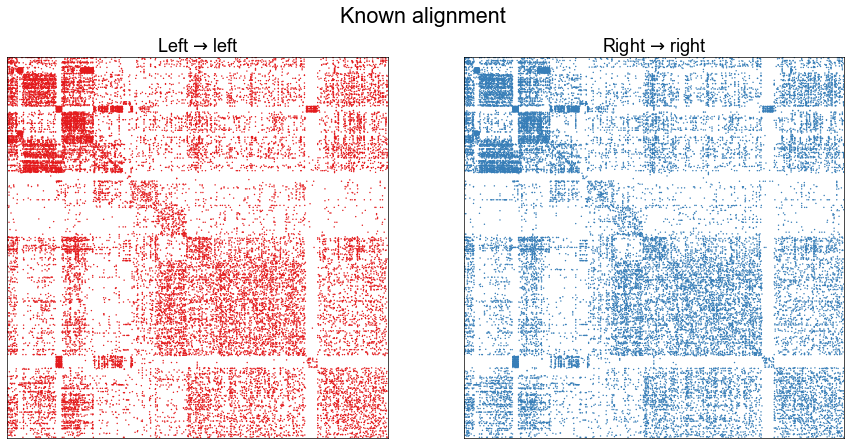

In [2]:
mg = load_maggot_graph()
mg = mg[mg.nodes["paper_clustered_neurons"]]

ll_mg, rr_mg, lr_mg, rl_mg = mg.bisect(paired=True)

ll_adj = ll_mg.sum.adj
rr_adj = rr_mg.sum.adj

nodes = ll_mg.nodes
nodes["_inds"] = range(len(nodes))
sorted_nodes = nodes.sort_values(["simple_group"])
sort_inds = sorted_nodes["_inds"]

ll_adj = ll_adj[np.ix_(sort_inds, sort_inds)]
rr_adj = rr_adj[np.ix_(sort_inds, sort_inds)]


def plot_adjs(left, right, title=""):
    fig, axs = plt.subplots(1, 2, figsize=(15, 7))
    adjplot(
        left,
        plot_type="scattermap",
        sizes=(2, 2),
        ax=axs[0],
        title=r"Left $\to$ left",
        color=palette["Left"],
    )
    adjplot(
        right,
        plot_type="scattermap",
        sizes=(2, 2),
        ax=axs[1],
        title=r"Right $\to$ right",
        color=palette["Right"],
    )
    fig.suptitle(title, ha="center", x=0.51)
    return fig, axs


plot_adjs(ll_adj, rr_adj, title="Known alignment")

## Run several restarts of graph matching to understand the variance in solutions

In [3]:


def generate_random_doubly_stochastic(n, alpha=0.5):
    J = np.ones((n, n)) / n
    K = np.random.uniform(size=(n, n))
    # Sinkhorn balancing
    K = _doubly_stochastic(K)
    P = J * (1 - alpha) + K * alpha
    return P


options = dict(maximize=True, maxiter=30, shuffle_input=False, tol=1e-14)
n = len(ll_adj)
n_restarts = 10
alpha = 0
initial_rows = []
best_res = None
best_fun = -np.inf
for i in range(n_restarts):
    currtime = time.time()
    shuffle_inds = np.random.permutation(n)
    unshuffle_inds = np.argsort(shuffle_inds)
    P0 = generate_random_doubly_stochastic(n, alpha)
    options["P0"] = P0.copy()
    res = quadratic_assignment(
        ll_adj, rr_adj[shuffle_inds][:, shuffle_inds], options=options
    )
    res["input_shuffle"] = shuffle_inds
    res["P0"] = P0
    initial_rows.append(res)
    if res["fun"] > best_fun:
        best_fun = res["fun"]
        best_res = res
    match_ratio = (unshuffle_inds == res["col_ind"]).mean()
    print(f"{time.time() - currtime:.3f} seconds elapsed for restart {i+1}.")
    print(f"Restart {i+1} did {res['nit']} iterations.")
    print(f"Final score: {res['fun']}")
    print(f"Match ratio: {match_ratio}")
    print()

8.459 seconds elapsed for restart 1.
Restart 1 did 30 iterations.
Final score: 813586.0
Match ratio: 0.8050478677110531

8.645 seconds elapsed for restart 2.
Restart 2 did 30 iterations.
Final score: 769614.0
Match ratio: 0.7597911227154047

9.153 seconds elapsed for restart 3.
Restart 3 did 30 iterations.
Final score: 803520.0
Match ratio: 0.8120104438642297

9.254 seconds elapsed for restart 4.
Restart 4 did 30 iterations.
Final score: 806390.0
Match ratio: 0.7771975630983464

8.952 seconds elapsed for restart 5.
Restart 5 did 24 iterations.
Final score: 809333.0
Match ratio: 0.793733681462141

9.024 seconds elapsed for restart 6.
Restart 6 did 28 iterations.
Final score: 807318.0
Match ratio: 0.7771975630983464

10.208 seconds elapsed for restart 7.
Restart 7 did 30 iterations.
Final score: 815936.0
Match ratio: 0.7989556135770235

8.027 seconds elapsed for restart 8.
Restart 8 did 23 iterations.
Final score: 816904.0
Match ratio: 0.8050478677110531

9.839 seconds elapsed for restar

## Illustrate graph matching progress by iteration

9.678 seconds elapsed.


<AxesSubplot:xlabel='iteration', ylabel='match_ratio'>

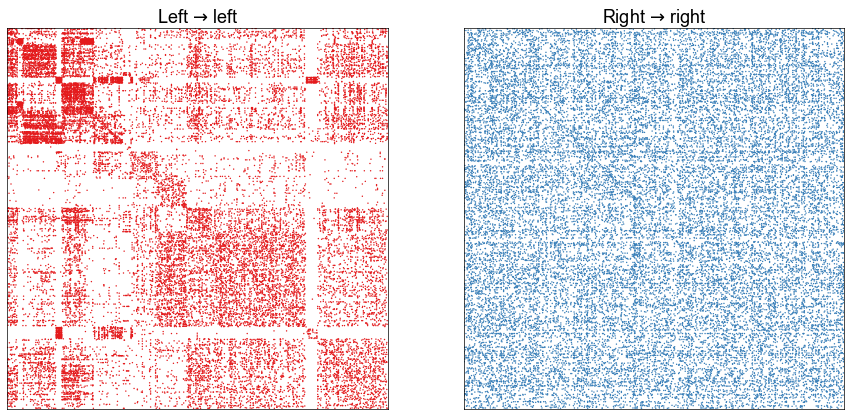

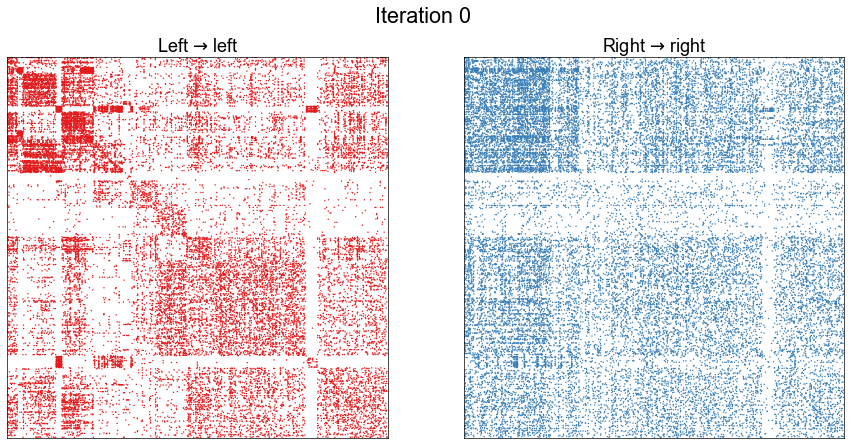

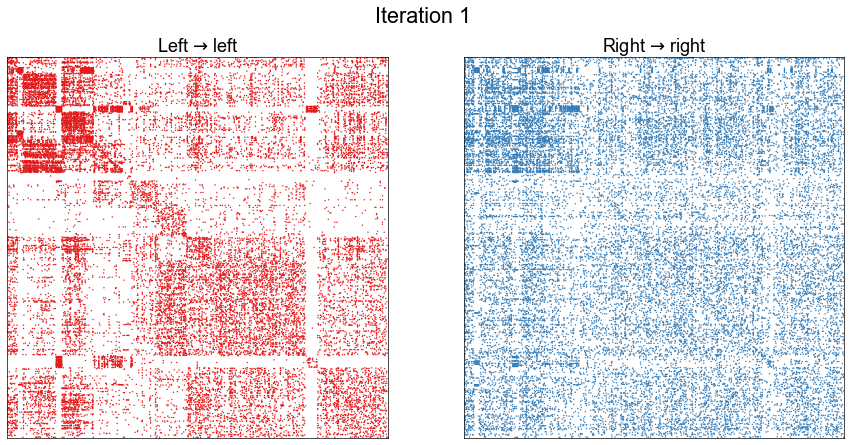

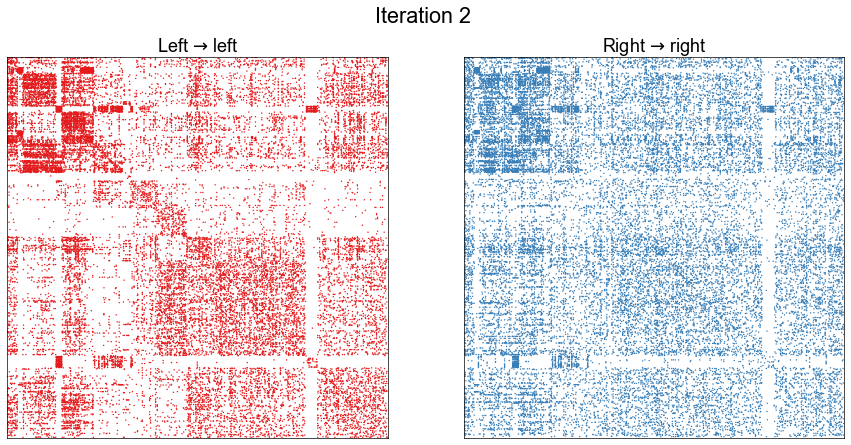

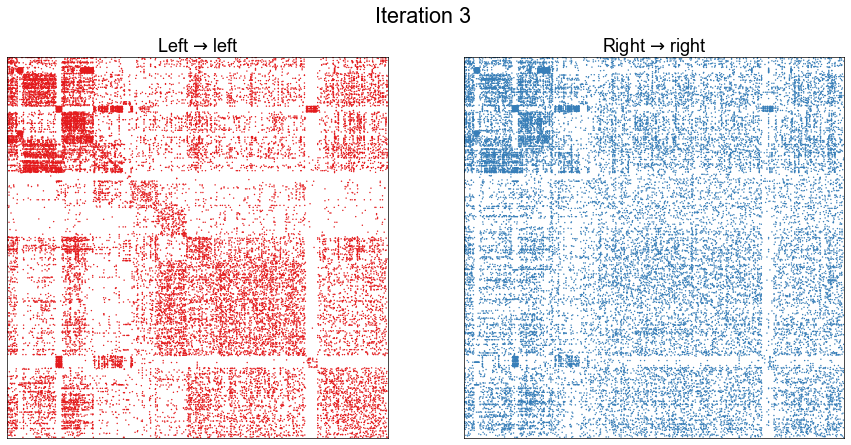

...

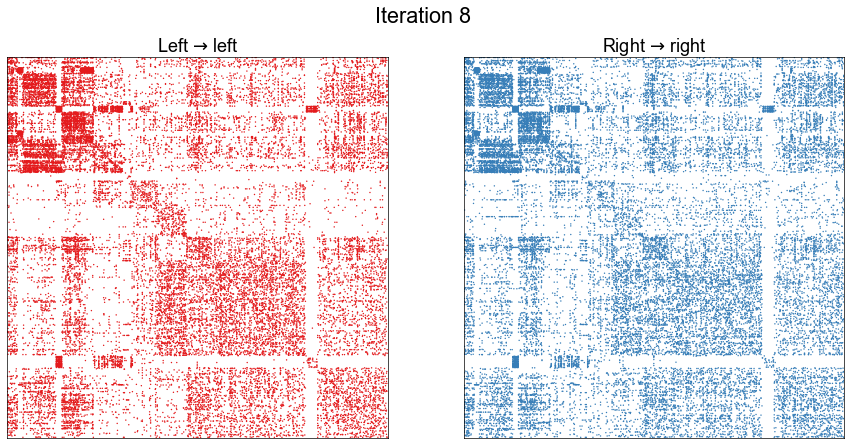

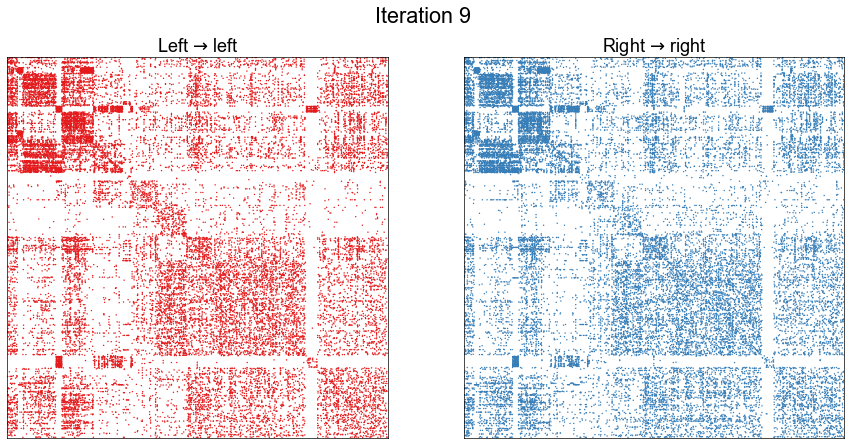

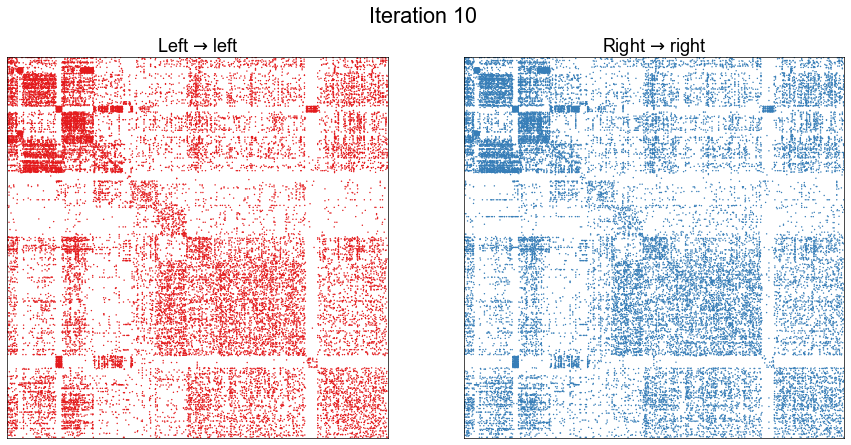

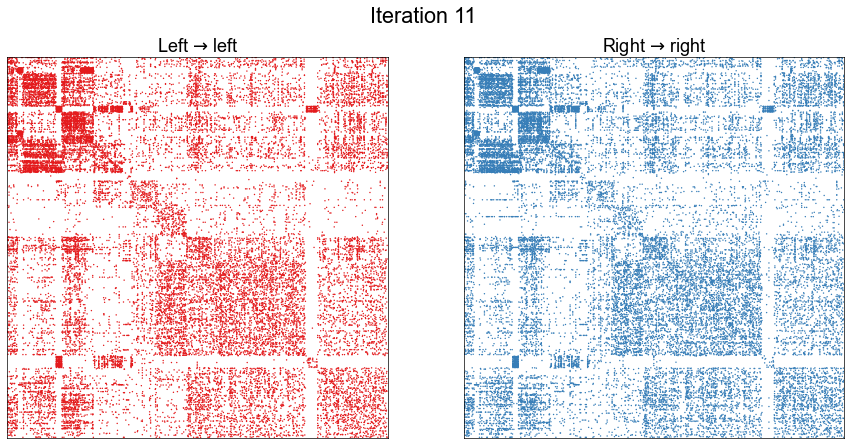

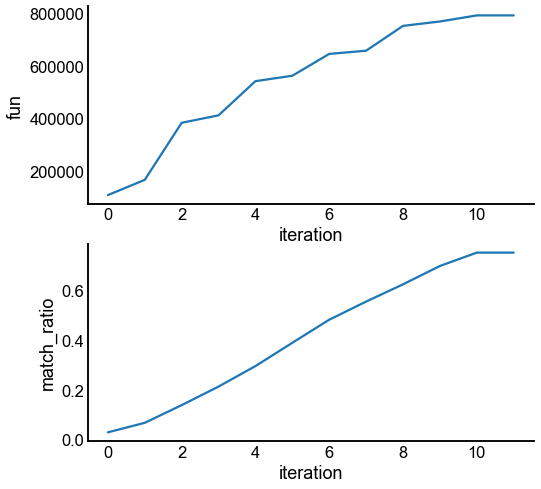

In [4]:

currtime = time.time()
max_iter = res["nit"]
options = dict(maximize=True, maxiter=1, shuffle_input=False, tol=1e-4)
n = len(ll_adj)
max_iter = 30
shuffle_inds = best_res["input_shuffle"]
P = best_res["P0"]
unshuffle_inds = np.argsort(shuffle_inds)
plot_adjs(ll_adj, rr_adj[shuffle_inds][:, shuffle_inds])
rows = []
fun = 0
for i in range(max_iter):
    options["P0"] = P
    rr_adj_shuffle = rr_adj[shuffle_inds][:, shuffle_inds]
    res = quadratic_assignment(ll_adj, rr_adj_shuffle, options=options)
    P = res["P_final"]
    res["iteration"] = i
    perm_inds = res["col_ind"]
    match_ratio = (perm_inds == unshuffle_inds).mean()
    res["match_ratio"] = match_ratio
    plot_adjs(ll_adj, rr_adj_shuffle[perm_inds][:, perm_inds], title=f"Iteration {i}")
    rows.append(res)
    if res["fun"] == fun:
        break
    fun = res["fun"]
print(f"{time.time() - currtime:.3f} seconds elapsed.")

results = pd.DataFrame(rows)

fig, axs = plt.subplots(2, 1, figsize=(8, 8))
sns.lineplot(data=results, x="iteration", y="fun", ax=axs[0])
sns.lineplot(data=results, x="iteration", y="match_ratio", ax=axs[1])

## Start graph matching from the known pairs to see if we can improve

In [5]:

gm = GraphMatch(n_init=25, init=np.eye(n), max_iter=100, shuffle_input=True, eps=1e-4)
gm.fit(ll_adj, rr_adj)
perm_inds = gm.perm_inds_
match_ratio = (perm_inds == np.arange(n)).mean()
print("Match ratio when initializing from known pairs:")
print(match_ratio)
print("GMP objective function after initializing from known pairs:")
print(gm.score_)
print("GMP objective function from known pairs:")
print((ll_adj * rr_adj).sum())

Match ratio when initializing from known pairs:
0.8790252393385553
GMP objective function after initializing from known pairs:
850889.0
GMP objective function from known pairs:
846735.0


## End

In [6]:
elapsed = time.time() - t0
delta = datetime.timedelta(seconds=elapsed)
print("----")
print(f"Script took {delta}")
print(f"Completed at {datetime.datetime.now()}")
print("----")

----
Script took 0:10:36.100451
Completed at 2021-03-20 12:23:44.553720
----
